In [83]:
#Importing the Gadfly package for use in this notebook
using Gadfly

# Gadfly
+ Simple plotting (introducing Gadfly)
+ Add layers
+ Use *Themes*
+ Add titles and axes labels
+ Save plots
+ Plotting from *DataFrames*
    + Box and whisker plots
    + Histograms
    + Violin plots
    + QQ plots
    + Scatter plots
    + Vertical and horizontal lines
+ Some more examples

## Simple plots

In [2]:
# Create 100 x-coordinate and 100 y-coordinate points, each value drawn at random from
# the standard normal distribution using the rand() function
xvals = rand(100)
yvals = rand(100)

100-element Array{Float64,1}:
 0.171885 
 0.0159796
 0.596055 
 0.18389  
 0.949755 
 0.0428944
 0.994531 
 0.990581 
 0.841199 
 0.881623 
 0.965588 
 0.103361 
 0.41122  
 ⋮        
 0.717577 
 0.929209 
 0.640016 
 0.43153  
 0.762583 
 0.0550221
 0.311856 
 0.353207 
 0.32287  
 0.134386 
 0.171324 
 0.341558 

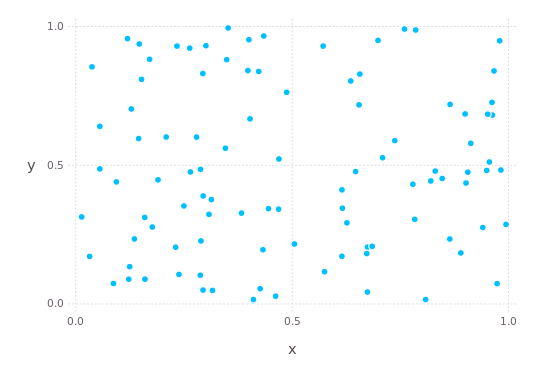

In [3]:
# Invoking the plot() function from Gadfly
# When we only pass two arguments (x and y) it results in a scatter plot (the geometry is taken as 'Geom.point')
# The x and y arguments are referred to as aesthetics
plot(x = xvals, y = yvals)

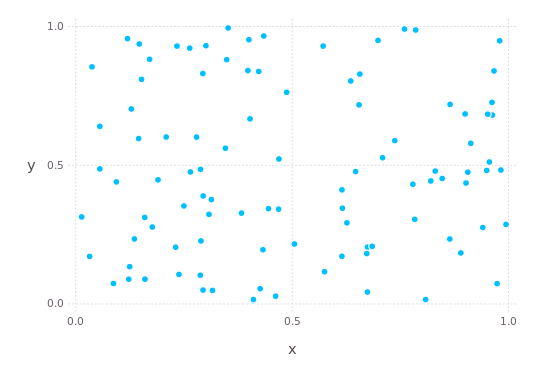

In [4]:
# Actually specifying the geomtery as points (which was done by default in the previous example)
# The point geometry takes the input x- and y-aesthetics
plot(x = xvals, y = yvals, Geom.point)

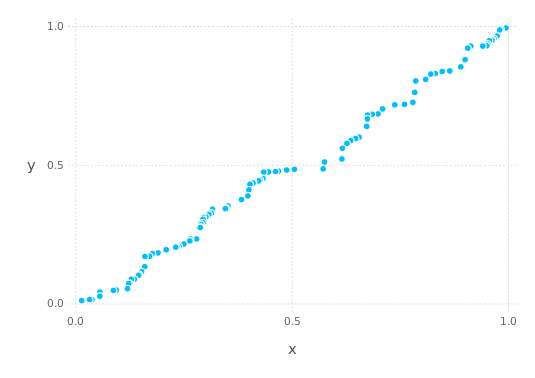

In [5]:
# Using the sort function (which changes the correlation complete)
plot(x = sort(xvals), y = sort(yvals))

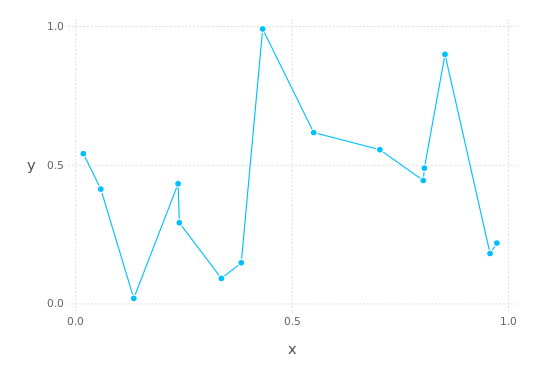

In [6]:
# Adding another geomtery, which in this case is a line connecting the points
# The point and line geometries act on the same input data
xvals2 = rand(15)
yvals2 = rand(15)
plot(x = xvals2, y = yvals2, Geom.point, Geom.line)

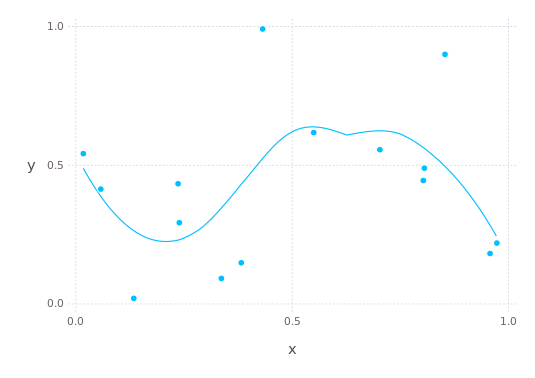

In [7]:
# We can also smooth out the line
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth)

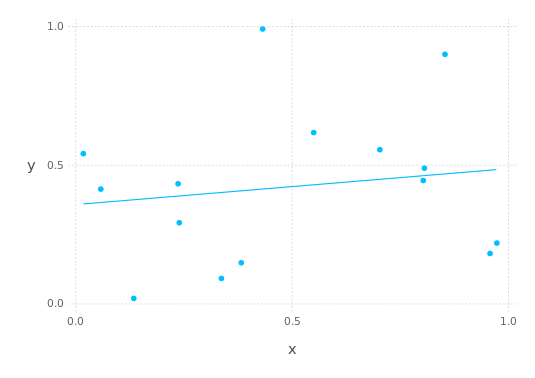

In [8]:
# Different model for the line
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth(method = :lm))

## Adding layers

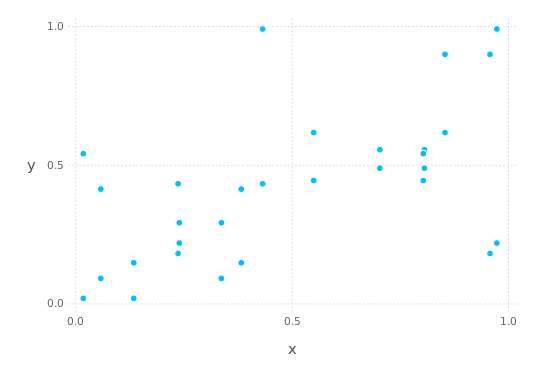

In [9]:
# Adding layer using the layer() function
# The geometry has to be specified now
plot(layer(x = xvals2, y = yvals2, Geom.point), layer(x = sort(xvals2), y = sort(yvals2), Geom.point))

## Using themes

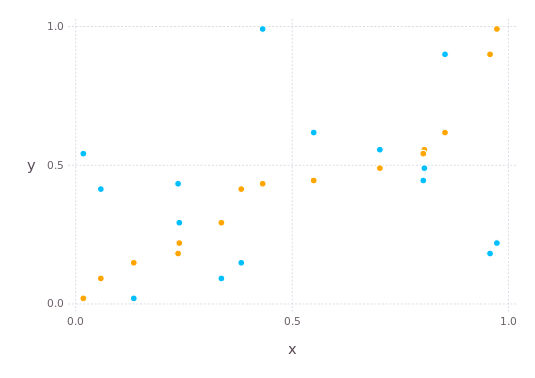

In [10]:
# It was not clear from the plot above that we were plotting two layers
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")))

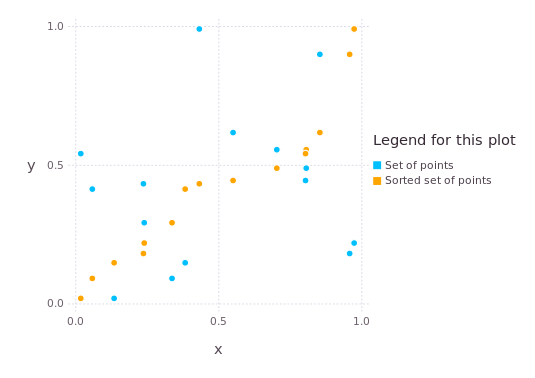

In [11]:
# Another way of doing layers
# Adding a legend
points1 = layer(x = xvals2, y = yvals2, Geom.point, Theme(default_color = colorant"deepskyblue"))
points2 = layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange"))
plot(points1, points2, Guide.manual_color_key("Legend for this plot",
["Set of points", "Sorted set of points"], ["deepskyblue", "orange"]))

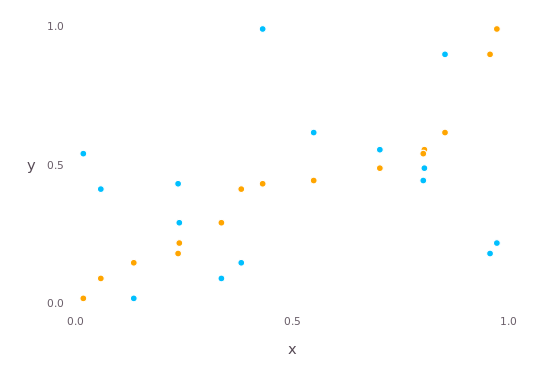

In [12]:
# Changing the grid color
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")),
Theme(grid_color = colorant"white"))

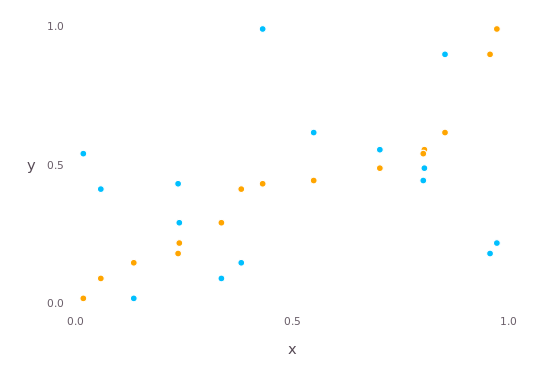

In [13]:
# Removing the pop-up (mouse-over) grid by changing its color to white too
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

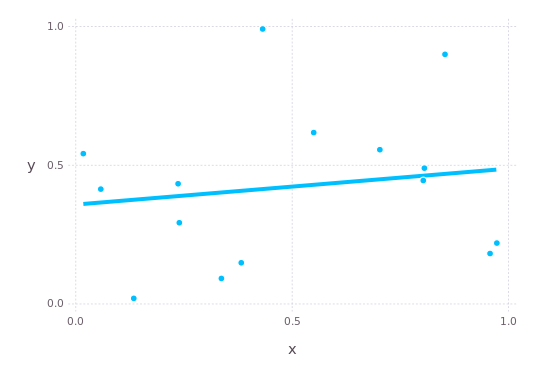

In [14]:
# Changing the size (stroke thickness) of the line
# Changing the line model
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth(method = :lm), Theme(line_width = 4px))

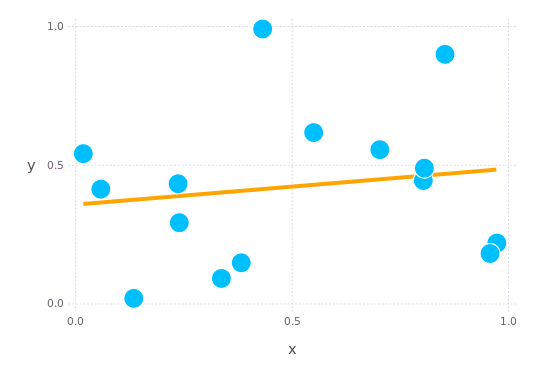

In [15]:
# Different colors for point and line by using different layers
# Changing the point size
plot(layer(x = xvals2, y = yvals2, Geom.point, Theme(point_size = 10px)),
layer(x = xvals2, y = yvals2, Geom.smooth(method = :lm), Theme(line_width = 4px, default_color = colorant"orange")))

## Adding titles and axes labels

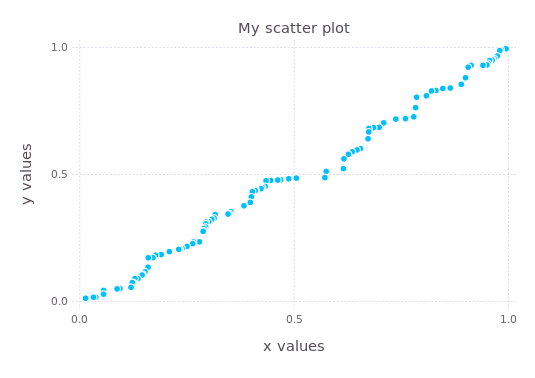

In [16]:
plot(x = sort(xvals), y = sort(yvals), Geom.point, 
Guide.title("My scatter plot"),
Guide.xlabel("x values"), Guide.ylabel("y values"))

## Saving a plot

In [17]:
# Use Cairo to save PNG files
using Cairo, Fontconfig

In [18]:
# The Distribution package for random variables
using Distributions

In [19]:
# Using normal distribution
plot1 = plot(x = rand(Normal(), 100), y = Normal(), Stat.qq, Geom.point, Guide.title("QQ plot"));
draw(PNG("myqqplot.png", 8inch, 6inch), plot1)

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] quantile(::Distributions.Normal{Float64}, ::Array{Float64,1}) at ./deprecated.jl:57
 [3] qqbuild(::Array{Float64,1}, ::Distributions.Normal{Float64}) at /home/me/.julia/v0.6/Distributions/src/qq.jl:18
 [4] apply_statistic(::Gadfly.Stat.QQStatistic, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /home/me/.julia/v0.6/Gadfly/src/statistics.jl:1491
 [5] apply_statistics(::Array{Gadfly.StatisticElement,1}, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /home/me/.julia/v0.6/Gadfly/src/statistics.jl:42
 [6] render_prepare(::Gadfly.Plot) at /home/me/.julia/v0.6/Gadfly/src/Gadfly.jl:696
 [7] render(::Gadfly.Plot) at /home/me/.julia/v0.6/Gadfly/src/Gadfly.jl:755
 [8] draw(::Compose.Image{Compose.PNGBackend}, ::Gadfly.Plot) at /home/me/.julia/v0.6/Gadfly/src/Gadfly.jl:869
 [9] include_string(::String, ::String) at ./loading.jl:522
 [10] include_stri

## Plotting from data

In [22]:
using DataFrames
using CSV

INFO: Recompiling stale cache file /home/me/.julia/lib/v0.6/CSV.ji for module CSV.


In [24]:
# Importing a .csv file and using the semicolon to supress the output
#df = readtable("GadflyTutorialData.csv");
df = CSV.read("GadflyTutorialData.csv");

In [25]:
# Looking at the last rows
# We note 200  row entries (patients)
# Gender, age, 4 variables and 3 categories
tail(df)

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,195,M,54,9.7,100,1.3,55,A,X,P
2,196,F,40,9.6,103,12.1,56,B,R,R
3,197,M,42,12.6,109,3.6,68,A,C,P
4,198,M,49,11.2,95,1.8,53,B,X,R
5,199,M,36,24.2,97,8.2,58,A,R,P
6,200,F,48,10.3,114,20.4,63,B,C,P


In [27]:
# Data types in each column
describe(df)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,Patient,100.5,1,100.5,200,,0,Int64
2,Gender,,,,,2,0,CategoricalArrays.CategoricalString{UInt32}
3,Age,45.805,35,46.0,55,,0,Int64
4,Variable1,17.051,8.5,16.75,24.9,,0,Float64
5,Variable2,100.025,64,101.0,125,,0,Int64
6,Variable3,10.414,0.1,7.6,77.9,,0,Float64
7,Variable4,59.715,50,60.0,70,,0,Int64
8,Category1,,,,,2,0,CategoricalArrays.CategoricalString{UInt32}
9,Category2,,,,,3,0,CategoricalArrays.CategoricalString{UInt32}
10,Category3,,,,,3,0,CategoricalArrays.CategoricalString{UInt32}


In [28]:
# Describe each column
describe(df[:Gender])

Summary Stats:
Length:         200
Type:           Union{CategoricalArrays.CategoricalString{UInt32}, Missings.Missing}
Number Unique:  2


In [29]:
# From the Case-Control-Series Project lectures
# Count of number per group of gender
# Use the values for categorical data analysis
by(df, :Gender, d -> DataFrame(N = size(d, 1)))

,Gender,N
1,F,100
2,M,100


In [30]:
describe(df[:Age])

Summary Stats:
Length:         200
Type:           Union{Int64, Missings.Missing}
Number Unique:  21


In [31]:
describe(df[:Variable1])

Summary Stats:
Length:         200
Type:           Union{Float64, Missings.Missing}
Number Unique:  127


In [32]:
describe(df[:Variable2])

Summary Stats:
Length:         200
Type:           Union{Int64, Missings.Missing}
Number Unique:  43


In [33]:
describe(df[:Variable3])

Summary Stats:
Length:         200
Type:           Union{Float64, Missings.Missing}
Number Unique:  137


In [34]:
describe(df[:Variable4])

Summary Stats:
Length:         200
Type:           Union{Int64, Missings.Missing}
Number Unique:  21


In [35]:
describe(df[:Category1])

Summary Stats:
Length:         200
Type:           Union{CategoricalArrays.CategoricalString{UInt32}, Missings.Missing}
Number Unique:  2


In [36]:
# Count of number per group of category 1
# Use the values for categorical data analysis
by(df, :Category1, d -> DataFrame(N = size(d, 1)))

,Category1,N
1,A,100
2,B,100


In [37]:
describe(df[:Category2])

Summary Stats:
Length:         200
Type:           Union{CategoricalArrays.CategoricalString{UInt32}, Missings.Missing}
Number Unique:  3


In [38]:
# Count of number per group of category 2
# Use the values for categorical data analysis
by(df, :Category2, d -> DataFrame(N = size(d, 1)))

,Category2,N
1,C,68
2,X,66
3,R,66


In [39]:
describe(df[:Category3])

Summary Stats:
Length:         200
Type:           Union{CategoricalArrays.CategoricalString{UInt32}, Missings.Missing}
Number Unique:  3


In [40]:
# Count of number per group of category 3
# Use the values for categorical data analysis
by(df, :Category3, d -> DataFrame(N = size(d, 1)))

,Category3,N
1,P,90
2,Q,44
3,R,66


### Boxplot

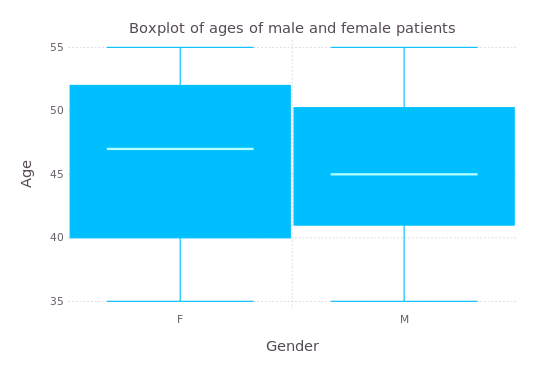

In [41]:
plot(df, x = "Gender", y = "Age", Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"))

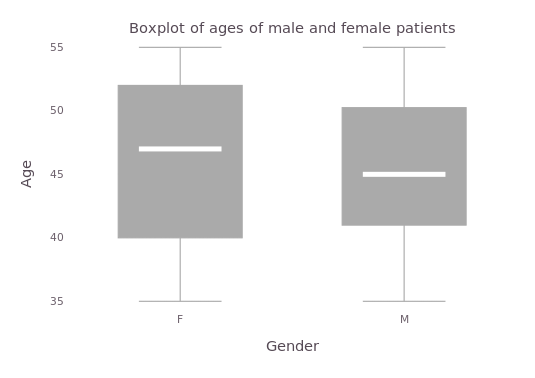

In [42]:
# Changing the size (stroke thickness) of the median line
# Change the color of the boxes and whiskers
# Increase the spacing between the boxes (making them thinner)
plot(df, x = "Gender", y = "Age", Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"),
Theme(boxplot_spacing = 100px, grid_color = colorant"white", default_color = colorant"#AAAAAA", middle_width = 5px))

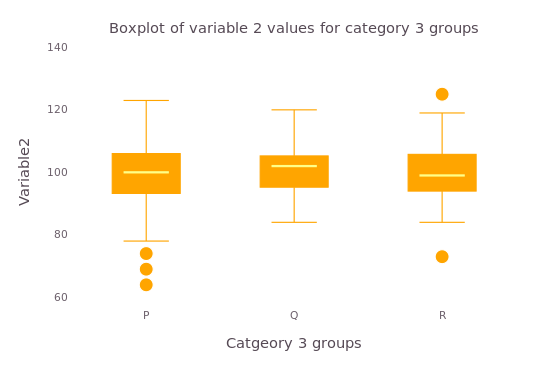

In [53]:
# Some more categories (by using Category 3
# Bigger outlier points
plot(df, x = "Category3", y = "Variable2", Geom.boxplot,
Guide.title("Boxplot of variable 2 values for category 3 groups"),
Guide.xlabel("Catgeory 3 groups"), Theme(default_color = colorant"orange",
grid_color = colorant"white", grid_color_focused = colorant"white",
boxplot_spacing = 80px, point_size = 7px))

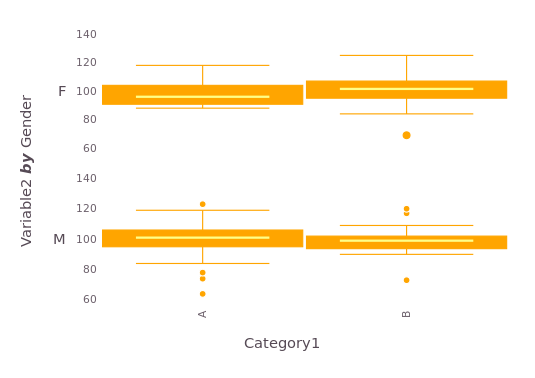

In [54]:
# Subplots to add another dimension to the plot
plot(df, ygroup = "Gender", x = "Category1", y = "Variable2", Geom.subplot_grid(Geom.boxplot),
Theme(default_color = colorant"orange",
grid_color = colorant"white", grid_color_focused = colorant"white"))

### Density
It's all about continuous variables on the *x*-axis

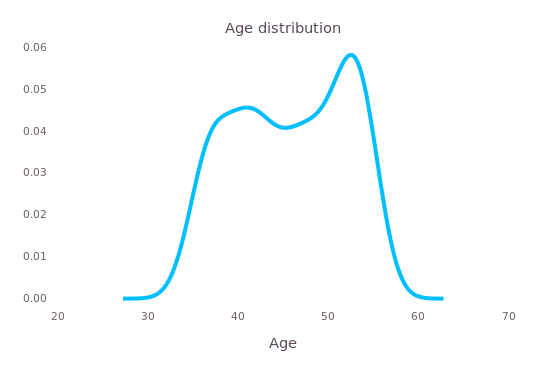

In [55]:
# Density estimate of ages
plot(df, x = "Age", Geom.density,
Guide.title("Age distribution"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white", line_width = 4px))

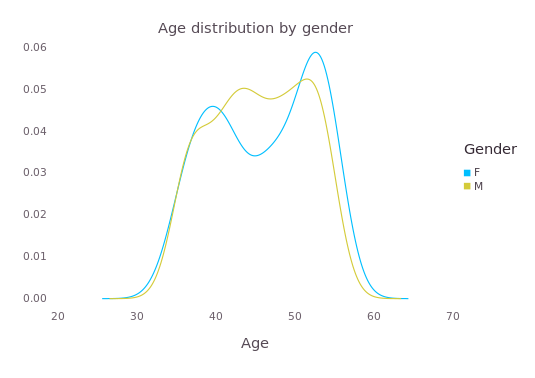

In [56]:
# Age distribution by group using the color argument
plot(df, x = "Age", color = "Gender", Geom.density,
Guide.title("Age distribution by gender"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

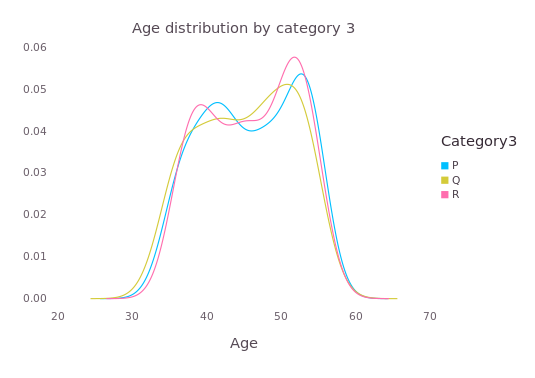

In [57]:
plot(df, x = "Age", color = "Category3", Geom.density,
Guide.title("Age distribution by category 3"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

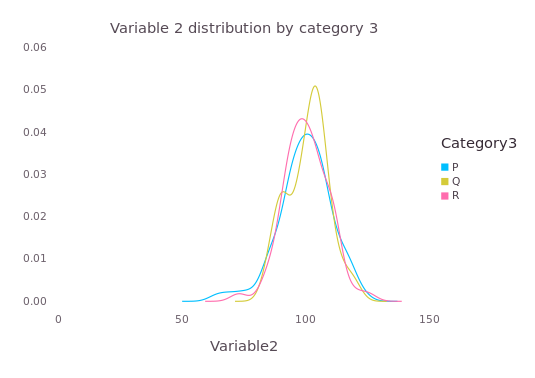

In [58]:
plot(df, x = "Variable2", color = "Category3", Geom.density,
Guide.title("Variable 2 distribution by category 3"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

### Histogram
As with density estimates, its all about continuous variables on the *x*-axis

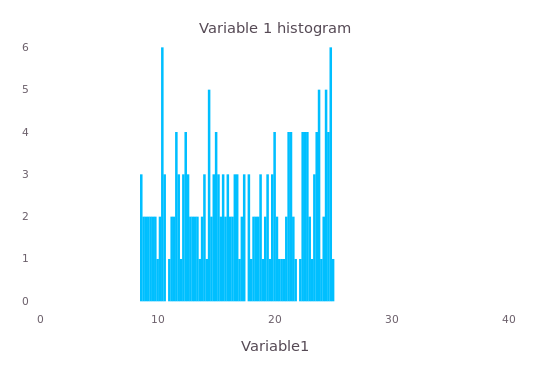

In [59]:
plot(df, x = "Variable1", Geom.histogram,
Guide.title("Variable 1 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

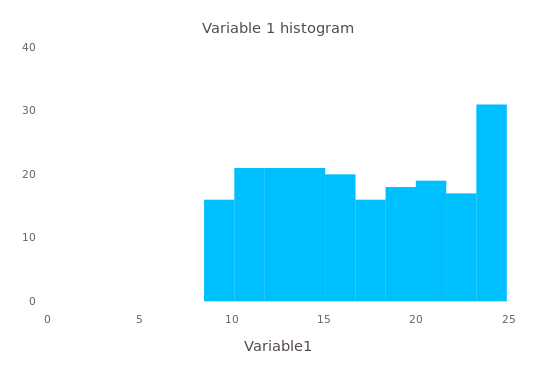

In [60]:
# Controlling the bincount
plot(df, x = "Variable1", Geom.histogram(bincount = 10),
Guide.title("Variable 1 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

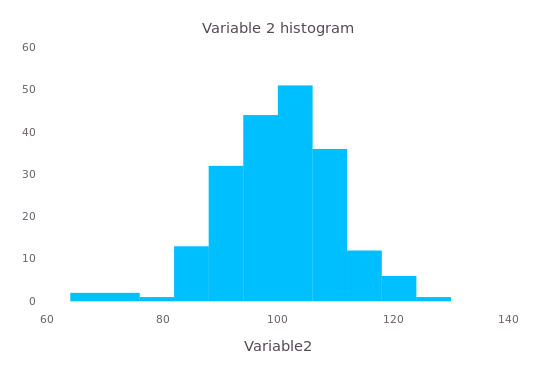

In [61]:
# A variable with a more normal distribution
plot(df, x = "Variable2", Geom.histogram(bincount = 11),
Guide.title("Variable 2 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

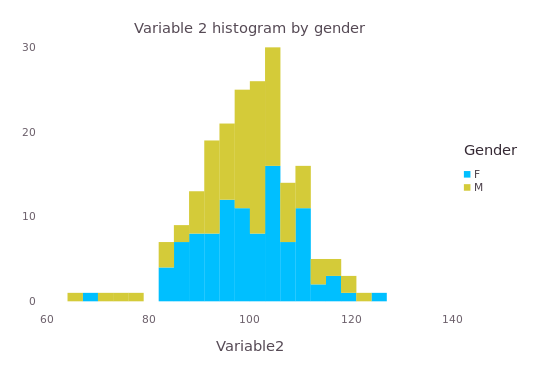

In [62]:
# An x-axis variable for more than one categorical groups
plot(df, x = "Variable2", color = "Gender", Geom.histogram(bincount = 21),
Guide.title("Variable 2 histogram by gender"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

## Violin plots
Combining density estimates and box and whisker plots

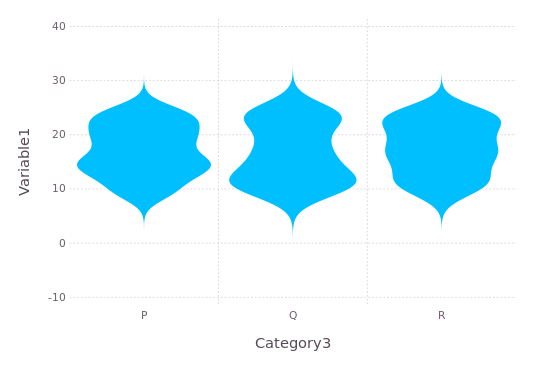

In [63]:
plot(df, x = :Category3, y = :Variable1, Geom.violin)

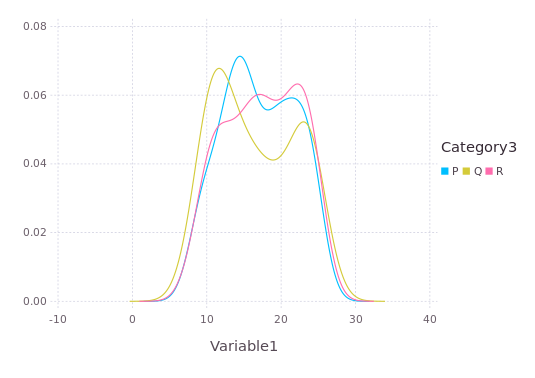

In [64]:
# Note how the shape is the same as the density plots
plot(df, x = :Variable1, color = :Category3, Geom.density)

### QQ plots
Visual help in deciding which type of statistical test to use

In [65]:
using Distributions

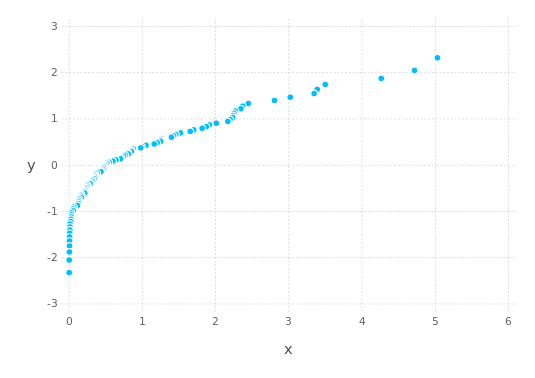

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] quantile(::Distributions.Normal{Float64}, ::Array{Float64,1}) at ./deprecated.jl:57
 [3] qqbuild(::Array{Float64,1}, ::Distributions.Normal{Float64}) at /home/me/.julia/v0.6/Distributions/src/qq.jl:18
 [4] apply_statistic(::Gadfly.Stat.QQStatistic, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /home/me/.julia/v0.6/Gadfly/src/statistics.jl:1491
 [5] apply_statistics(::Array{Gadfly.StatisticElement,1}, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /home/me/.julia/v0.6/Gadfly/src/statistics.jl:42
 [6] render_prepare(::Gadfly.Plot) at /home/me/.julia/v0.6/Gadfly/src/Gadfly.jl:696
 [7] render(::Gadfly.Plot) at /home/me/.julia/v0.6/Gadfly/src/Gadfly.jl:755
 [8] show at /home/me/.julia/v0.6/Gadfly/src/Gadfly.jl:959 [inlined]
 [9] limitstringmime(::MIME{Symbol("image/svg+xml")}, ::Gadfly.Plot) at /home/me/.julia/v0.6/IJulia/src/inline.jl:36
 [1

In [66]:
# These sample point were not from a population in which the underlying variable is
# normally distributed (cannot use non-parametric tests)
plot(x = rand(Chisq(1), 100), y = Normal(), Stat.qq, Geom.point)

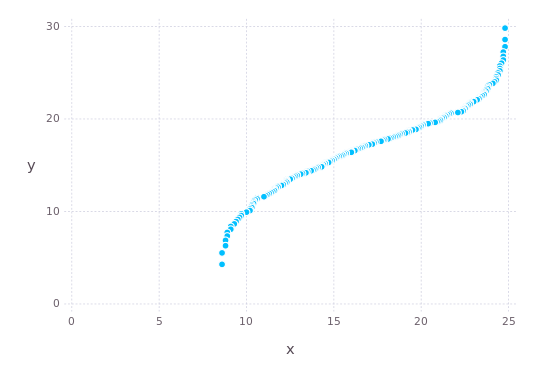

In [67]:
# Checking to see if variable 1 is from a sample in which the underlying population has that
# variable normally distributed
plot(x = sort(df[:Variable1]), y = Normal(mean(df[:Variable1]), std(df[:Variable1])), Stat.qq, Geom.point)

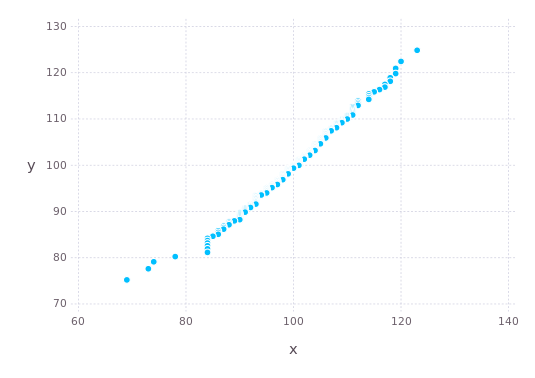

In [68]:
# Variable 2
plot(x = sort(df[:Variable2]), y = Normal(mean(df[:Variable2]), std(df[:Variable2])), Stat.qq, Geom.point)

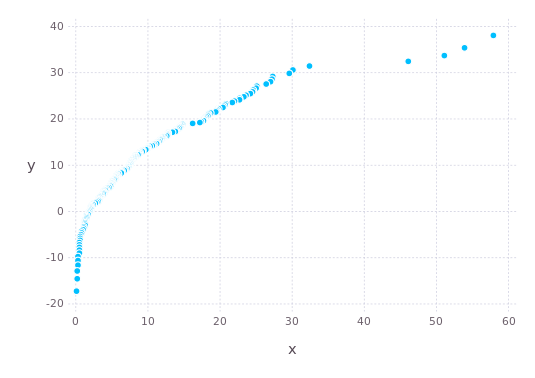

In [69]:
# Variable 3
plot(x = sort(df[:Variable3]), y = Normal(mean(df[:Variable3]), std(df[:Variable3])), Stat.qq, Geom.point)

### Scatter plots

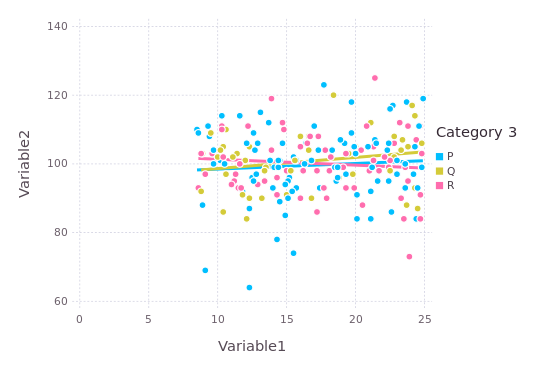

In [73]:
# Setting the title for the graph key (legend)
plot(df, x = "Variable1", y ="Variable2", color = "Category3",
Geom.point, Geom.smooth(method = :lm), Guide.colorkey(title="Category 3"), Theme(line_width = 3px))

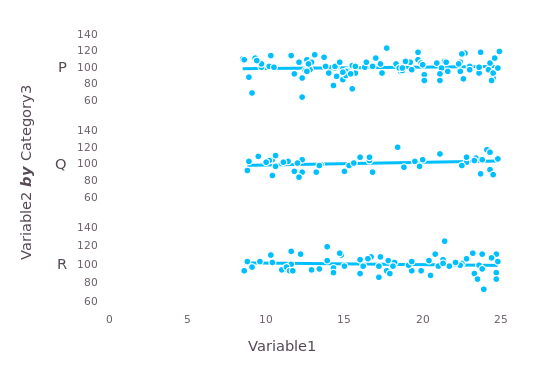

In [74]:
# Subplots to add another dimension to the plot
plot(df, ygroup = "Category3", x = "Variable1", y = "Variable2", Geom.subplot_grid(Geom.point, Geom.smooth(method = :lm)),
Theme(grid_color = colorant"white", line_width = 3px))

## Vertical and horizontal lines

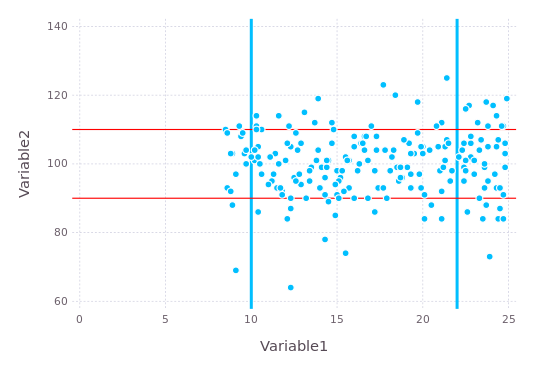

In [75]:
# Drawing two vertical and two horizontal lines
# Adding size and color
plot(df, x = "Variable1", y = "Variable2", yintercept = [90, 110], Geom.point, Geom.hline(color = colorant"Red"),
xintercept = [10, 22], Geom.vline(size = 3px))

## More examples

### Step lines

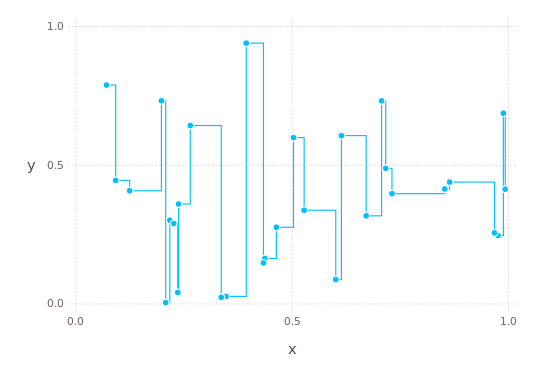

In [76]:
# Horizontal then vertical
x = rand(30)
y = rand(30)
plot(x = x, y = y, Geom.point, Geom.step(direction = :hv))

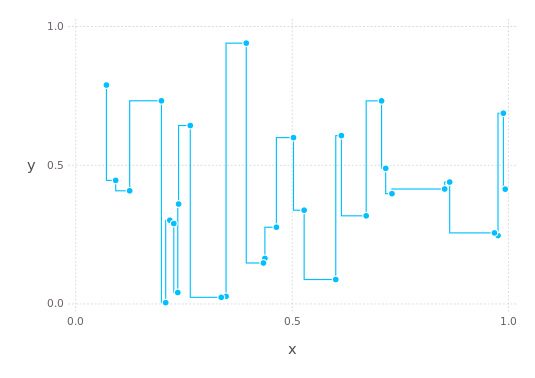

In [77]:
# Vertical then horizontal
plot(x = x, y = y, Geom.point, Geom.step(direction = :vh))

### Beeswarm

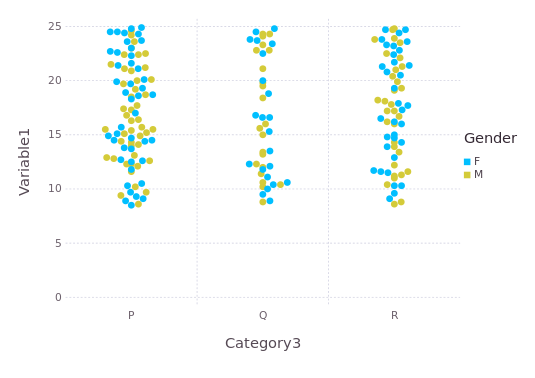

In [78]:
plot(df, x = :Category3, y = :Variable1, color = :Gender, Geom.beeswarm)

### Continuous color scales

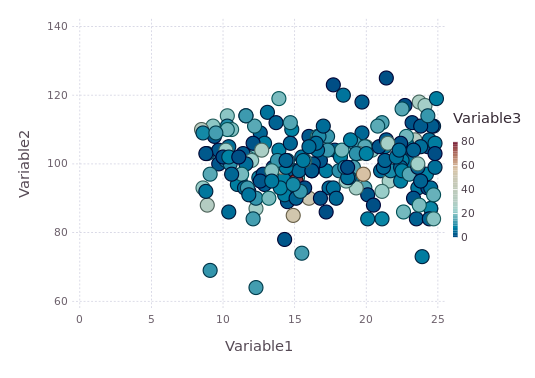

In [80]:
plot(df, x = :Variable1, y = :Variable2, color = :Variable3,
Scale.color_continuous(minvalue = minimum(df[:Variable3]), maxvalue = maximum(df[:Variable3])),
Theme(point_size = 7px))

### Manually choosing colors

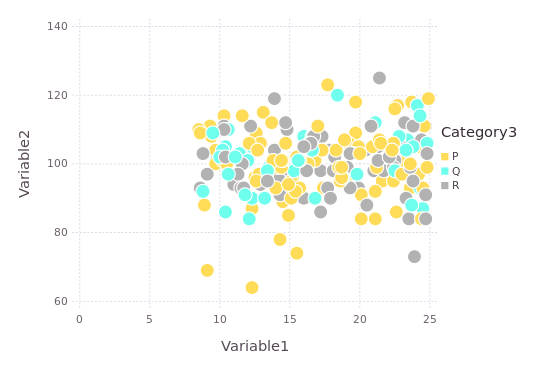

In [81]:
plot(df, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(point_size = 7px))

### Another way of getting rid of grid lines

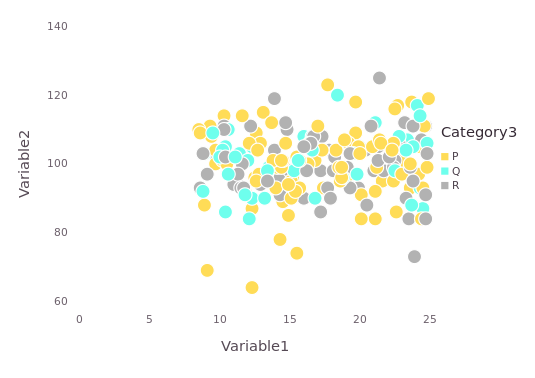

In [82]:
plot(df, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(point_size = 7px, grid_line_width = 0px))